In [1]:
import json
import pandas as pd

In [2]:
movies = pd.read_csv('Downloads/input/tmdb_5000_movies.csv')
credits = pd.read_csv('Downloads/input/tmdb_5000_credits.csv')

In [3]:
df = movies.set_index('id').join(credits.set_index('movie_id')
                                 .drop(columns=['title']), how='inner')

df = df.drop(columns=['budget', 'homepage', 'original_language',
                      'production_countries', 'release_date', 'revenue',
                      'runtime', 'spoken_languages', 'status', 'tagline'])

for column in ['genres', 'keywords', 'production_companies', 'cast', 'crew']:
    df[column] = df[column].apply(json.loads)

df.head()

,genres,keywords,original_title,overview,popularity,production_companies,title,vote_average,vote_count,cast,crew
19995,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...","[{'id': 1463, 'name': 'culture clash'}, {'id':...",Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{'name': 'Ingenious Film Partners', 'id': 289...",Avatar,7.2,11800,"[{'cast_id': 242, 'character': 'Jake Sully', '...","[{'credit_id': '52fe48009251416c750aca23', 'de..."
285,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...","[{'id': 270, 'name': 'ocean'}, {'id': 726, 'na...",Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{'name': 'Walt Disney Pictures', 'id': 2}, {'...",Pirates of the Caribbean: At World's End,6.9,4500,"[{'cast_id': 4, 'character': 'Captain Jack Spa...","[{'credit_id': '52fe4232c3a36847f800b579', 'de..."
206647,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...","[{'id': 470, 'name': 'spy'}, {'id': 818, 'name...",Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{'name': 'Columbia Pictures', 'id': 5}, {'nam...",Spectre,6.3,4466,"[{'cast_id': 1, 'character': 'James Bond', 'cr...","[{'credit_id': '54805967c3a36829b5002c41', 'de..."
49026,"[{'id': 28, 'name': 'Action'}, {'id': 80, 'nam...","[{'id': 849, 'name': 'dc comics'}, {'id': 853,...",The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{'name': 'Legendary Pictures', 'id': 923}, {'...",The Dark Knight Rises,7.6,9106,"[{'cast_id': 2, 'character': 'Bruce Wayne / Ba...","[{'credit_id': '52fe4781c3a36847f81398c3', 'de..."
49529,"[{'id': 28, 'name': 'Action'}, {'id': 12, 'nam...","[{'id': 818, 'name': 'based on novel'}, {'id':...",John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{'name': 'Walt Disney Pictures', 'id': 2}]",John Carter,6.1,2124,"[{'cast_id': 5, 'character': 'John Carter', 'c...","[{'credit_id': '52fe479ac3a36847f813eaa3', 'de..."


In [4]:
df.shape

(4803, 11)

# 배우 목록
### 딕셔너리 자료구조를 이용
- 키값은 배우의 아이디로 설정
- 내용은 배우의 이름과 출연 횟수로 설정

In [5]:
cast_all = dict()
for cast_group in df['cast']:
    for cast in cast_group:
        if cast['id'] in cast_all:
            cast_all[cast['id']][1] += 1
        else:
            cast_all[cast['id']] = [cast['name'], 1]

In [6]:
cast_all

{65731: ['Sam Worthington', 10],
 8691: ['Zoe Saldana', 20],
 10205: ['Sigourney Weaver', 33],
 32747: ['Stephen Lang', 11],
 17647: ['Michelle Rodriguez', 13],
 1771: ['Giovanni Ribisi', 24],
 59231: ['Joel David Moore', 6],
 30485: ['CCH Pounder', 8],
 15853: ['Wes Studi', 9],
 10964: ['Laz Alonso', 9],
 95697: ['Dileep Rao', 3],
 98215: ['Matt Gerald', 5],
 154153: ['Sean Anthony Moran', 1],
 397312: ['Jason Whyte', 1],
 42317: ['Scott Lawrence', 8],
 986734: ['Kelly Kilgour', 2],
 1207227: ['James Patrick Pitt', 1],
 1180936: ['Sean Patrick Murphy', 2],
 1019578: ['Peter Dillon', 1],
 91443: ['Kevin Dorman', 3],
 173391: ['Kelson Henderson', 2],
 1207236: ['David Van Horn', 1],
 215913: ['Jacob Tomuri', 2],
 143206: ['Michael Blain-Rozgay', 2],
 169676: ['Jon Curry', 2],
 1048610: ['Luke Hawker', 2],
 42288: ['Woody Schultz', 4],
 68278: ['Peter Mensah', 7],
 1207247: ['Sonia Yee', 1],
 1207248: ['Jahnel Curfman', 3],
 89714: ['Ilram Choi', 2],
 1207249: ['Kyla Warren', 1],
 120725

### 전체 배우의 수

In [7]:
len(cast_all)

54588

### 배우 목록을 출연 횟수가 많은 순서대로 정렬

In [8]:
cast_freq = list(cast_all.values())
cast_freq.sort(reverse=True, key=lambda x: (x[1]))

In [9]:
cast_freq

[['Samuel L. Jackson', 67],
 ['Robert De Niro', 57],
 ['Bruce Willis', 51],
 ['Matt Damon', 48],
 ['Morgan Freeman', 46],
 ['Steve Buscemi', 43],
 ['Liam Neeson', 41],
 ['Johnny Depp', 40],
 ['Owen Wilson', 40],
 ['John Goodman', 39],
 ['Nicolas Cage', 39],
 ['Alec Baldwin', 39],
 ['Willem Dafoe', 38],
 ['Jim Broadbent', 38],
 ['Stanley Tucci', 38],
 ['Brad Pitt', 38],
 ['Paul Giamatti', 37],
 ['Will Ferrell', 37],
 ['Richard Jenkins', 36],
 ['Susan Sarandon', 36],
 ['J.K. Simmons', 35],
 ['Bill Murray', 35],
 ['Christopher Walken', 35],
 ['Keith David', 35],
 ['Bill Hader', 34],
 ['Jack Black', 34],
 ['Paul Rudd', 34],
 ['Ben Kingsley', 34],
 ['George Clooney', 34],
 ['Anthony Hopkins', 34],
 ['Robin Williams', 34],
 ['Justin Long', 34],
 ['David Koechner', 34],
 ['Sigourney Weaver', 33],
 ['Laurence Fishburne', 33],
 ['Frank Welker', 33],
 ['Tom Cruise', 33],
 ['Ben Stiller', 33],
 ['Brian Cox', 33],
 ['William H. Macy', 33],
 ['Julia Roberts', 33],
 ['Tom Hanks', 32],
 ['Arnold Schw

# 시각화를 통한 분석
### 배우의 출연 횟수를 그래프로 표현
- 출연 횟수가 급격히 낮아짐
- 다른 방식의 분석 필요

In [10]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12, 6))
plt.plot([cast_info[1] for cast_info in cast_freq])
plt.show()

<Figure size 1200x600 with 1 Axes>

### 배우들의 출연 횟수별 배우의 수를 확인
- 한번만 출연하는 배우가 대부분을 차지함을 알 수 있음

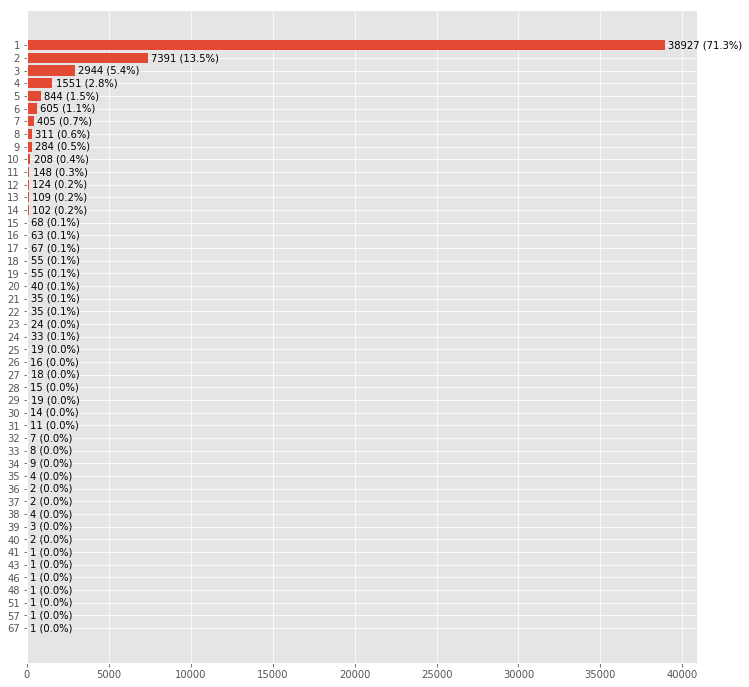

In [11]:
frequency = dict()
for cast_info in [cast_info[1] for cast_info in cast_freq]:
    if cast_info in frequency:
        frequency[cast_info] += 1
    else:
        frequency[cast_info] = 1

frequency_list = list(frequency.keys())
frequency_count = list(frequency.values())

import numpy as np
from matplotlib import style

style.use('ggplot')

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)

ypos = np.arange(len(frequency_count))
rects = plt.barh(ypos, frequency_count, align='center', height=0.8)
plt.yticks(ypos, frequency_list)

#실제 데이터를 텍스트로 보이게끔 추가
for i, rect in enumerate(rects):
    ax.text(rect.get_width() + 200, rect.get_y() + rect.get_height() / 2.0,
            str(frequency_count[i]) + ' (%0.1f%%)' % (frequency_count[i] / len(cast_freq) * 100), ha='left', va='center')

plt.show()

# 영화마다 벡터 생성

In [12]:
cast2vec_dict = dict()
count = 0;
for cast_id in cast_all.keys():
    cast2vec_dict[cast_id] = count
    count += 1

cast_vectors = list()
for cast_group in df['cast']:
    cast_vector = [0] * len(cast_all)
    for cast in cast_group:
        cast_vector[cast2vec_dict[cast['id']]] = 1
    cast_vectors.append(cast_vector)

In [13]:
cast_vectors

[[1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  1,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
